In [1]:
.libPaths("/mnt/home/icb/laura.martens/miniconda3/envs/archr/lib/R/library")

In [2]:
library(data.table)
library(stringr)
library(Signac)
library(Seurat)
library(GenomeInfoDb)
library(EnsDb.Hsapiens.v75)
library(ggplot2)
library(patchwork)
set.seed(1234)

Warning message:
“package ‘Signac’ was built under R version 4.1.3”
Warning message:
“package ‘Seurat’ was built under R version 4.1.3”
Attaching SeuratObject

Attaching sp

Warning message:
“package ‘GenomeInfoDb’ was built under R version 4.1.3”
Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min


Loading required package: S4Vectors

Warning message:
“package ‘S4Vectors’ was built under R version 4.1.3”
Loading required package: stats

# Load signac object

In [3]:
data_path <- '/lustre/groups/ml01/workspace/laura.martens/moretti_colab/cellranger/merged/outs/'

In [4]:
counts <- Read10X_h5(filename = paste0(data_path, "filtered_peak_bc_matrix.h5"))

In [5]:
metadata <- read.csv(
  file = paste0(data_path, "singlecell.csv"),
  header = TRUE,
  row.names = 1
)

In [6]:
chrom_assay <- CreateChromatinAssay(
  counts = counts,
  sep = c(":", "-"),
  genome = 'hg19',
  fragments = paste0(data_path, "fragments.tsv.gz"),
  min.cells = 10,
  min.features = 200
)

Computing hash



In [7]:
atac <- CreateSeuratObject(
  counts = chrom_assay,
  assay = "peaks",
  meta.data = metadata
)

Warning message in CreateSeuratObject.Assay(counts = chrom_assay, assay = "peaks", :
"Some cells in meta.data not present in provided counts matrix."
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from peaks to peaks_"


In [8]:
# extract gene annotations from EnsDb
annotations <- GetGRangesFromEnsDb(ensdb = EnsDb.Hsapiens.v75)

Warning message in .Seqinfo.mergexy(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .Seqinfo.mergexy(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .Seqinfo.mergexy(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .Seqinfo.mergexy(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .Seqinfo.mergexy(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .Seqinfo.mergexy(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .Seqinfo.mergexy(x, y):
"The 2 combined objec

In [9]:
# change to UCSC style since the data was mapped to hg19
seqlevelsStyle(annotations) <- 'UCSC'

In [10]:
# add the gene information to the object
Annotation(atac) <- annotations

In [13]:
atac[[]]


,orig.ident,nCount_peaks,nFeature_peaks,TSS_fragments,DNase_sensitive_region_fragments,enhancer_region_fragments,promoter_region_fragments,on_target_fragments,blacklist_region_fragments,peak_region_fragments,peak_region_cutsites,passed_filters,duplicate,cell_id,is__cell_barcode
,<fct>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,<int>
AAACGAAAGACACAAT-4,SeuratProject,145026,35245,44416,96124,25246,42132,103364,46,75354,145026,120814,149532,_cell_0,1
AAACGAAAGACTTGAA-7,SeuratProject,2641,1274,853,1792,434,841,1873,3,1364,2641,2139,5266,_cell_1,1
AAACGAAAGATATGAC-3,SeuratProject,57228,21405,17252,44928,14475,15797,47698,19,30353,57228,54576,25216,_cell_2,1
AAACGAAAGCGTAGCA-2,SeuratProject,9620,4377,3656,8467,2532,3321,9288,7,5096,9620,11535,3429,_cell_3,1
AAACGAAAGCTCCGGT-3,SeuratProject,23049,9707,6823,16518,4929,6330,17573,9,11997,23049,20386,13957,_cell_4,1
AAACGAAAGGAAGAAC-2,SeuratProject,14595,6580,4304,10867,3732,4062,11728,10,7551,14595,13668,8481,_cell_5,1
AAACGAAAGGAGAACA-7,SeuratProject,6028,2855,1929,4353,1190,1792,4584,3,3150,6028,5103,12318,_cell_6,1
AAACGAAAGGATTGAT-3,SeuratProject,60654,21129,19149,41174,10909,18129,43826,33,31703,60654,50493,24659,_cell_7,1
AAACGAAAGGCTTTAC-7,SeuratProject,75412,24034,24708,59557,18406,23616,63583,28,39554,75413,68785,96359,_cell_8,1


## QC

### Metric description

We use a combination of QC metrics derived from the 10x metadata and newly calculated metrics:
- **atac_fragments:** Total number of fragments per cell; cellular sequencing depth (includes all fragment before binarization of the matrix)
- **TSS.enrichment:** Transcriptional start site (TSS) enrichment score; ratio of fragments centered at the TSS to fragments in TSS-flanking regions
- **reads_in_peaks_frac:** Fraction of fragments in peak regions; fraction of all fragments that fall within ATAC-seq peaks
- **blacklist_fraction:** Ratio of reads in genomic blacklist regions; blacklist regions are often associated with artefactual signal (defined by ENCODE)
- **nucleosome_signal:** Nucleosome banding pattern; length of paired-end reads should follow pattern that corresponds to DNA length needed to be wrapped around one or multiple nucleosomes

## Calculate QC metrics

In [51]:
# compute TSS enrichment score per cell (this step takes a few minutes)
atac <- TSSEnrichment(object = atac, fast = TRUE)

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score



In [52]:
# compute nucleosome signal per cell
atac <- NucleosomeSignal(object = atac)

In [80]:
atac

An object of class Seurat 
162003 features across 29329 samples within 1 assay 
Active assay: peaks (162003 features, 0 variable features)

In [78]:
# add fraction of reads in peaks
atac <- FRiP(
  object = atac,
  assay = 'peaks',
  total.fragments = 'atac_fragments',
  col.name = "reads_in_peaks_frac"
)

Calculating fraction of reads in peaks per cell



ERROR: Error: Cannot add more or fewer cell meta.data information without values being named with cell names


## Plot QC metrics

### Overview

In [ ]:
# overview of single metrics

options(repr.plot.width=22, repr.plot.height=8) # figure size


VlnPlot(
  object = pbmc,
  features = c('pct_reads_in_peaks', 'peak_region_fragments',
               'TSS.enrichment', 'blacklist_ratio', 'nucleosome_signal'),
  pt.size = 0.1,
  ncol = 5,
  group.by=NULL
)

In [ ]:
# log(fragments) vs TSS enrichment with potential cut-offs

options(repr.plot.width=12, repr.plot.height=8) # figure size

ggplot(atac@meta.data, aes(x=log10(atac_fragments), y=TSS.enrichment) ) +
  geom_hex(bins = 150) +
  scale_fill_continuous(type = "viridis") +
  theme_bw()+
  geom_hline(yintercept = 4, lty = "dashed") +
  geom_hline(yintercept = 20, lty = "dashed") +
  geom_vline(xintercept = log10(600), lty = "dashed") +
  geom_vline(xintercept = log10(90000), lty = "dashed")

### Single metrics with cut-off decisions

Next, we plot each metric as a violin plot or histogram and decide suitable cut-offs.

In general, choose rather **permissive thresholds** since we have a downstreem QC step when combining modalities.

#### Total number of fragments

In [42]:
lower_totfraq_thresh = 800
upper_totfraq_thresh = 100000

In [43]:
# Reduce data to upper or lower part for plotting
lower_totfraqplot <- atac$peak_region_fragments[atac$peak_region_fragments < 2000]
upper_totfraqplot <- atac$peak_region_fragments[atac$peak_region_fragments > 25000 & atac$peak_region_fragments < 2*10**5]


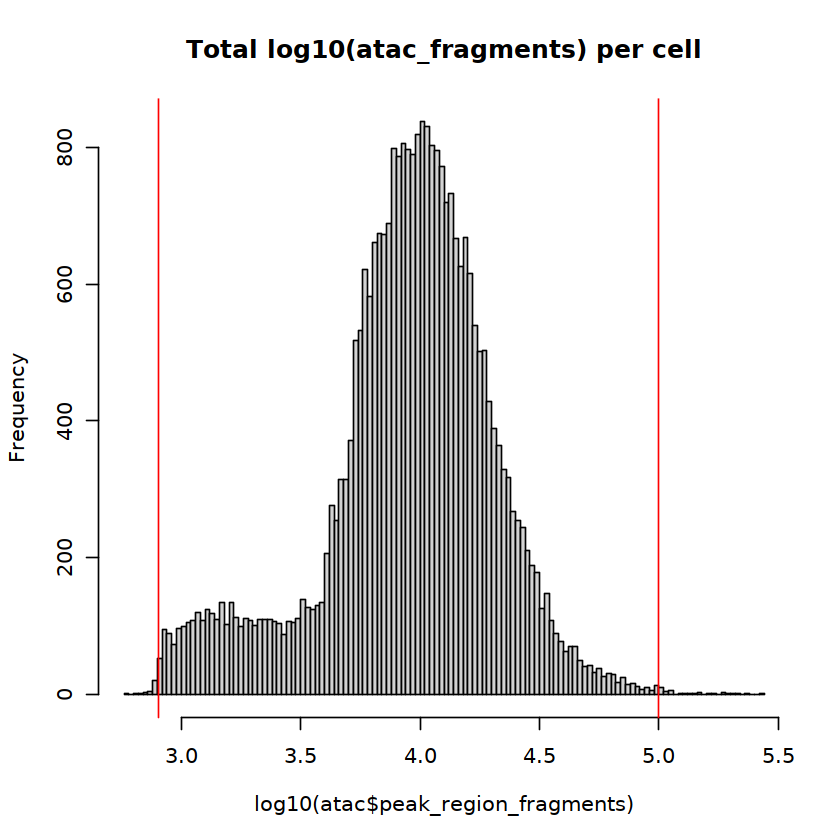

In [44]:
hist(log10(atac$peak_region_fragments), breaks = 150,
    main = 'Total log10(atac_fragments) per cell')
abline(v=log10(lower_totfraq_thresh), col = 'red')
abline(v=log10(upper_totfraq_thresh), col = 'red')

[1] "Removes 40 cells"


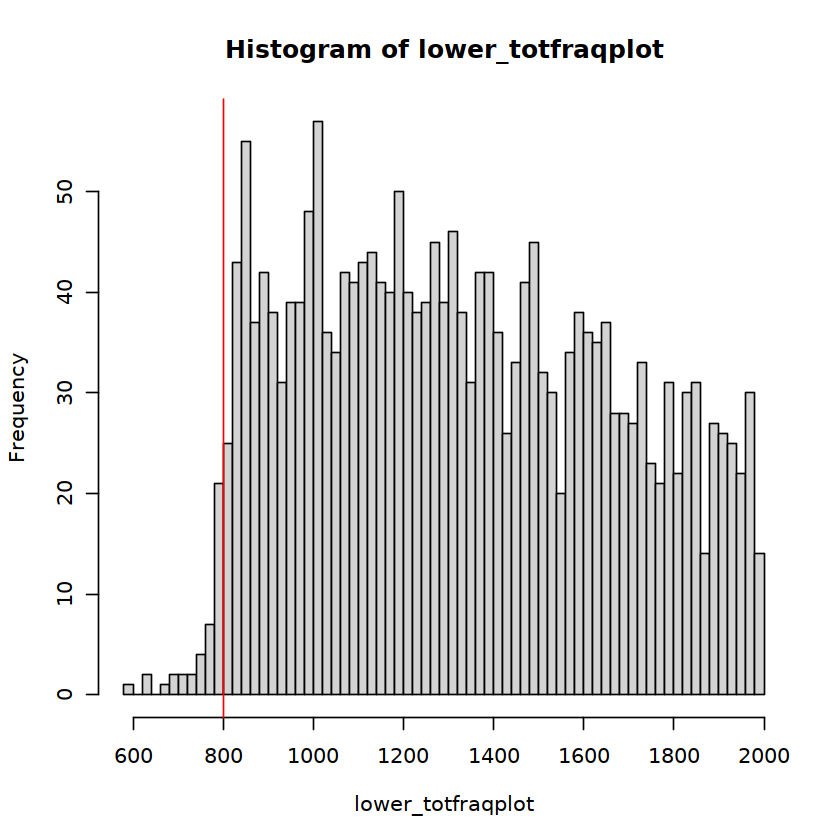

In [45]:
print(paste('Removes', as.character(sum(atac$peak_region_fragments < lower_totfraq_thresh)),'cells'))
hist(lower_totfraqplot, breaks = 100)
abline(v=lower_totfraq_thresh, col = 'red')

[1] "Removes 40 cells"


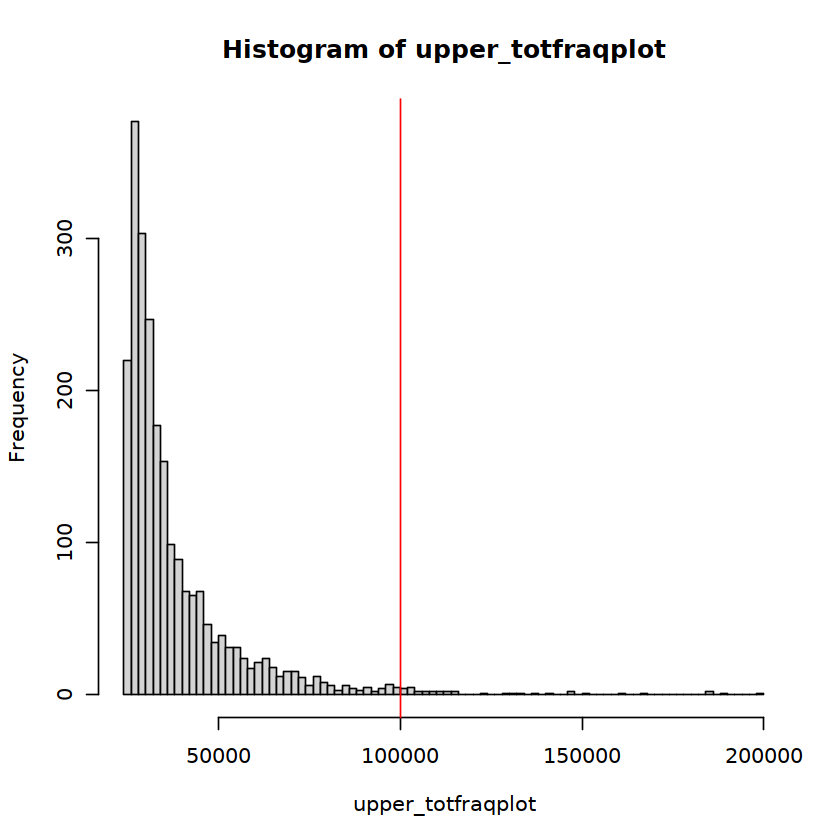

In [46]:
print(paste('Removes', as.character(sum(atac$peak_region_fragments > upper_totfraq_thresh)),'cells'))
hist(upper_totfraqplot, breaks = 100)
abline(v=upper_totfraq_thresh, col = 'red')

#### TSS enrichment

We don't consider a high TSS score as problematic, so we only filter for low and extreme high outliers

In [71]:
lower_tss_thresh = 3
upper_tss_thresh = 10

In [72]:
lower_tssplot <- atac$TSS.enrichment[atac$TSS.enrichment < 6]
upper_tssplot <- atac$TSS.enrichment[atac$TSS.enrichment > 5]

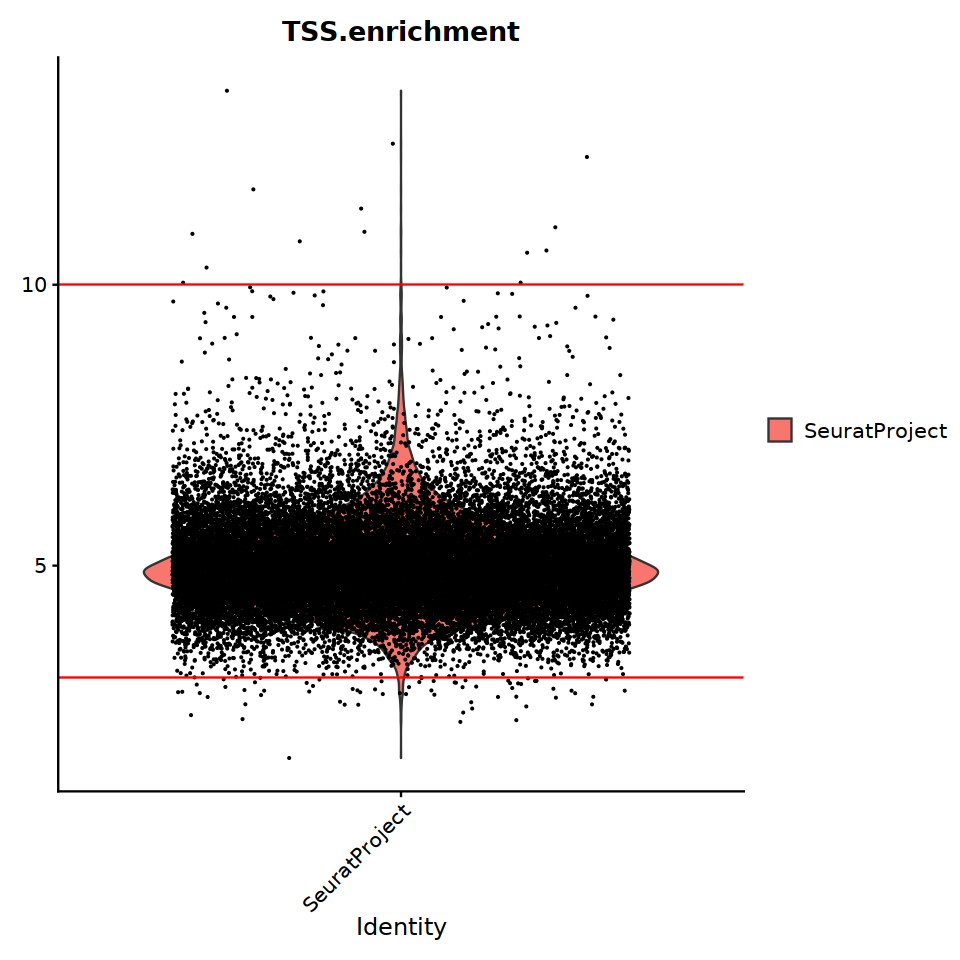

In [73]:
options(repr.plot.width=8, repr.plot.height=8) # figure size

v_plot <- VlnPlot(
    object = atac,
    features = c('TSS.enrichment'),
    pt.size = 0.1,
    ncol = 1,
)

v_plot + 
geom_hline(yintercept=lower_tss_thresh, color='red') +
geom_hline(yintercept=upper_tss_thresh, color='red') 

[1] "Removes 65 cells"


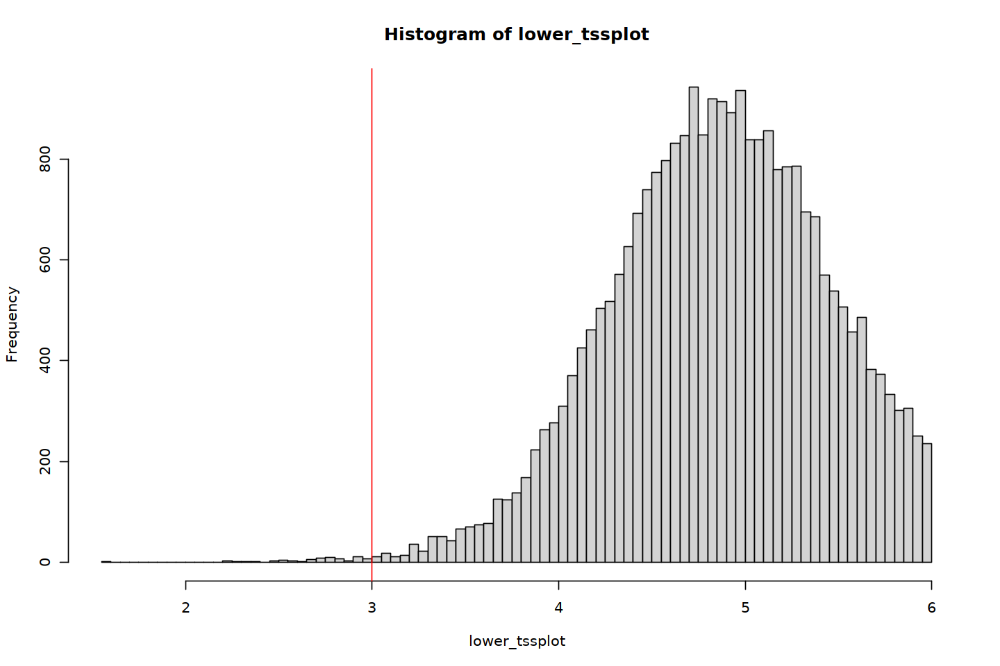

In [74]:
print(paste('Removes', as.character(sum(atac$TSS.enrichment < lower_tss_thresh)),'cells'))

options(repr.plot.width=12, repr.plot.height=8) # figure size

hist(lower_tssplot, breaks = 100)
abline(v=lower_tss_thresh, col = 'red')


[1] "Removes 14 cells"


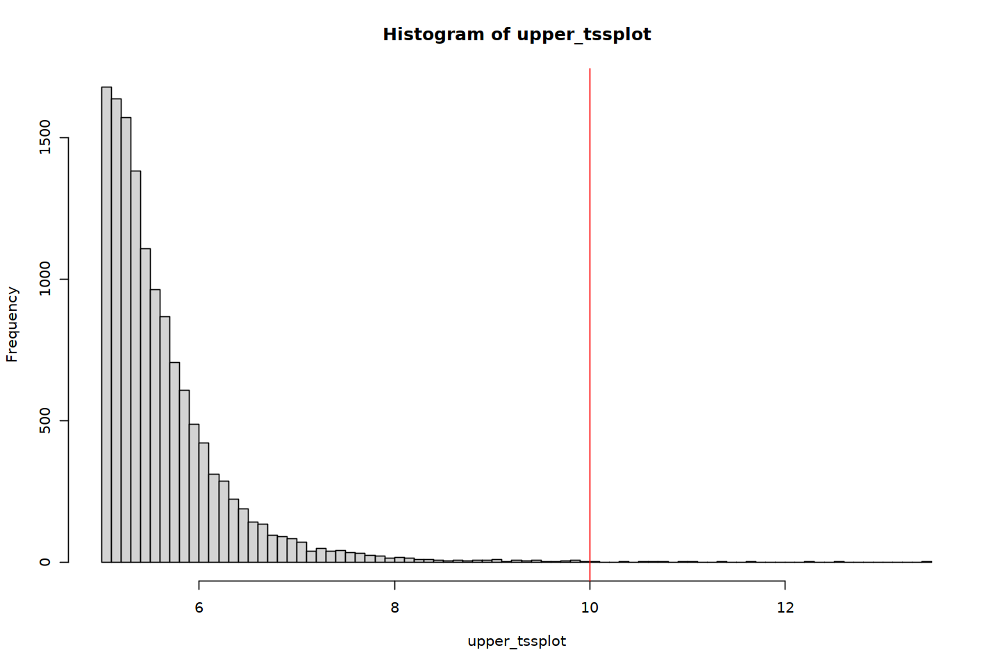

In [75]:
print(paste('Removes', as.character(sum(atac$TSS.enrichment > upper_tss_thresh)),'cells'))

options(repr.plot.width=12, repr.plot.height=8) # figure size

hist(upper_tssplot, breaks = 100)
abline(v=upper_tss_thresh, col = 'red')


#### Fraction of reads within peaks

Only remove lower tip

In [76]:
lower_in_peak_frac_thresh = 0.2

In [77]:
lower_in_peak_frac_plot <- atac$reads_in_peaks_frac[atac$reads_in_peaks_frac < 0.5]

ERROR: Error: Cannot find 'reads_in_peaks_frac' in this Seurat object


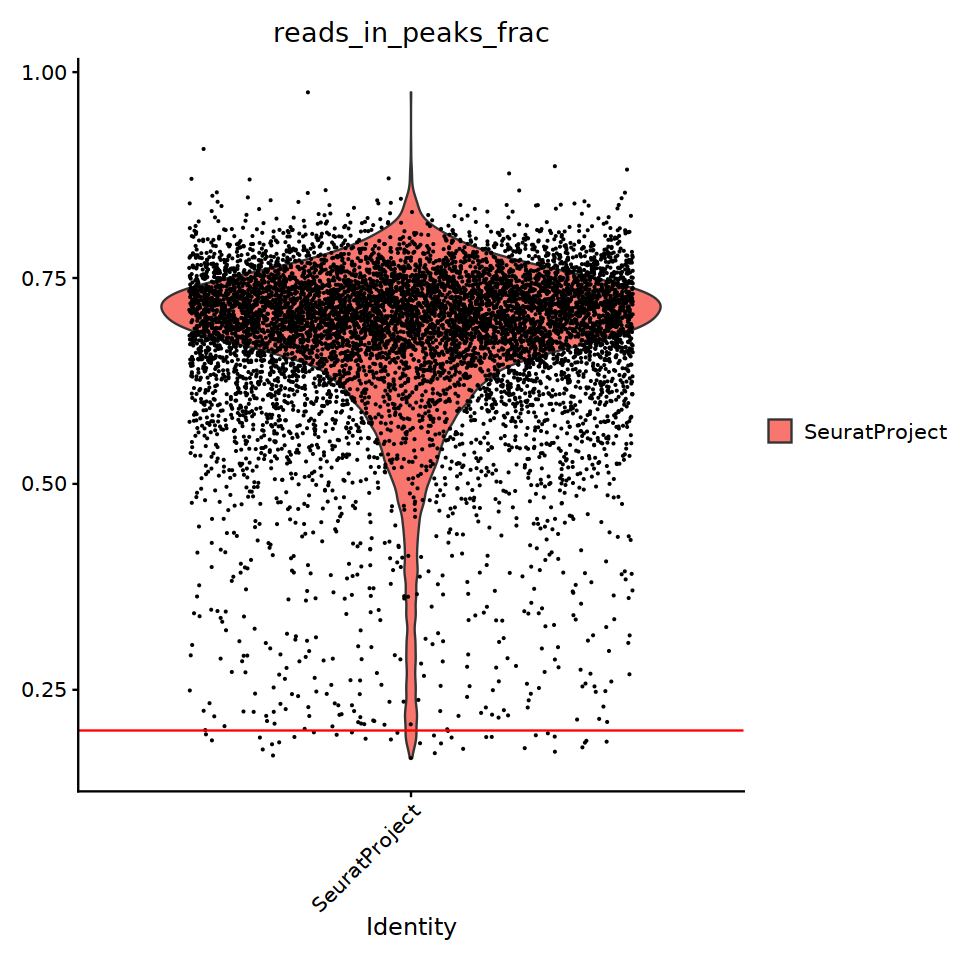

In [42]:
options(repr.plot.width=8, repr.plot.height=8) # figure size

v_plot <- VlnPlot(
    object = atac,
    features = c('reads_in_peaks_frac'),
    pt.size = 0.1,
    ncol = 1,
)

v_plot + 
geom_hline(yintercept=lower_in_peak_frac_thresh, color='red') 

[1] "Removes 32 cells"


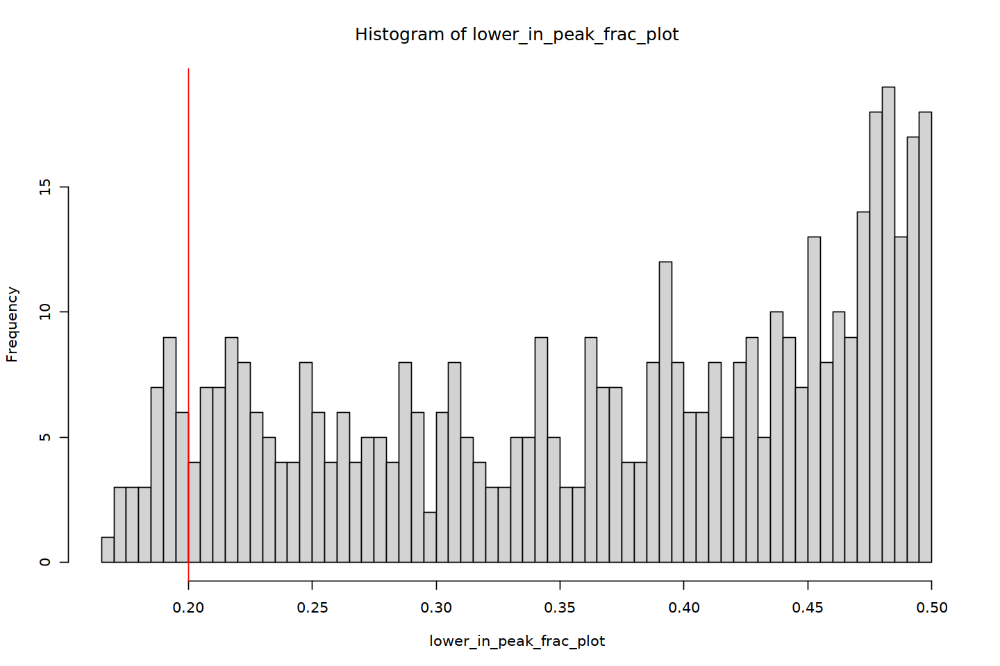

In [43]:
print(paste('Removes', as.character(sum(atac$reads_in_peaks_frac < lower_in_peak_frac_thresh)),'cells'))

options(repr.plot.width=12, repr.plot.height=8) # figure size

hist(lower_in_peak_frac_plot, breaks = 100)
abline(v=lower_in_peak_frac_thresh, col = 'red')


#### Blacklist fraction

Only remove upper tail

In [8]:
upper_bl_thresh = 0.0126

In [45]:
upper_bl_plot <- atac$blacklist_fraction[atac$blacklist_fraction > 0.005 & atac$blacklist_fraction < 0.03]

Warning message:
“Removed 3 rows containing non-finite values (stat_ydensity).”
Warning message:
“Removed 3 rows containing missing values (geom_point).”


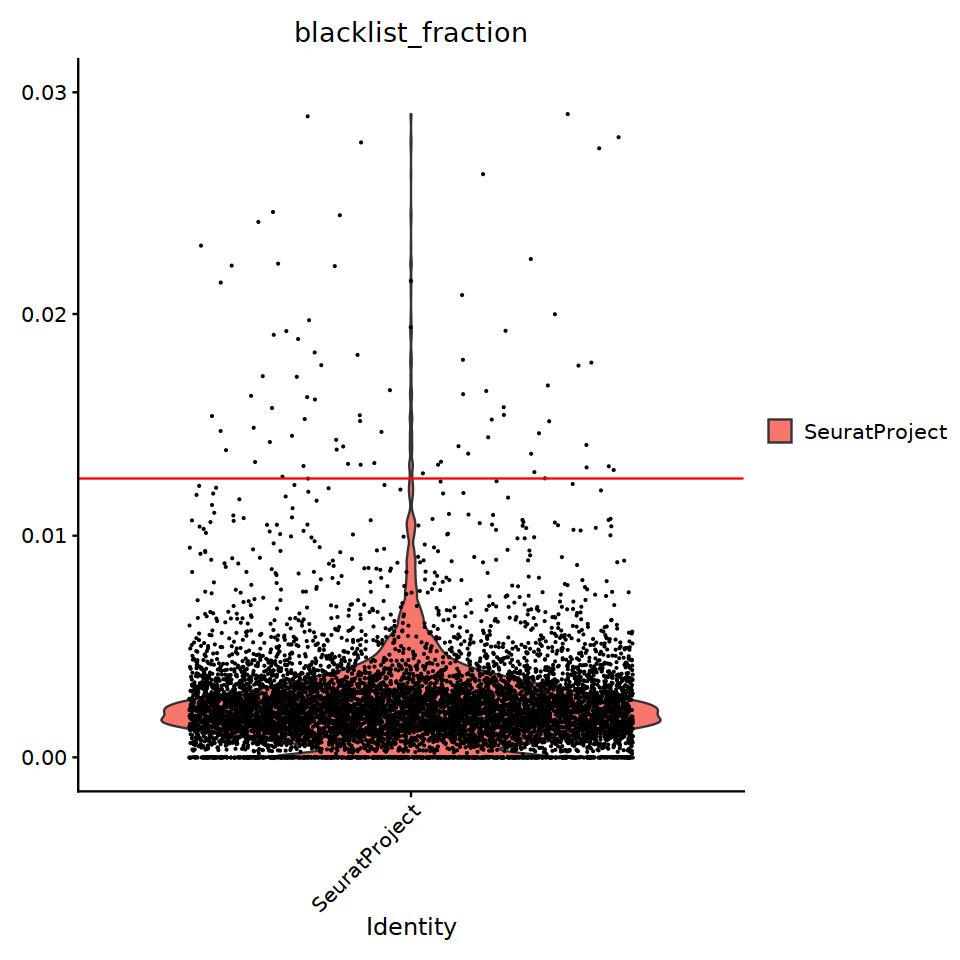

In [46]:
options(repr.plot.width=8, repr.plot.height=8) # figure size

v_plot <- VlnPlot(
    object = atac,
    features = c('blacklist_fraction'),
    pt.size = 0.1,
    ncol = 1,
    y.max = 0.03
)

v_plot + 
geom_hline(yintercept=upper_bl_thresh, color='red') 

[1] "Removes 79 cells"


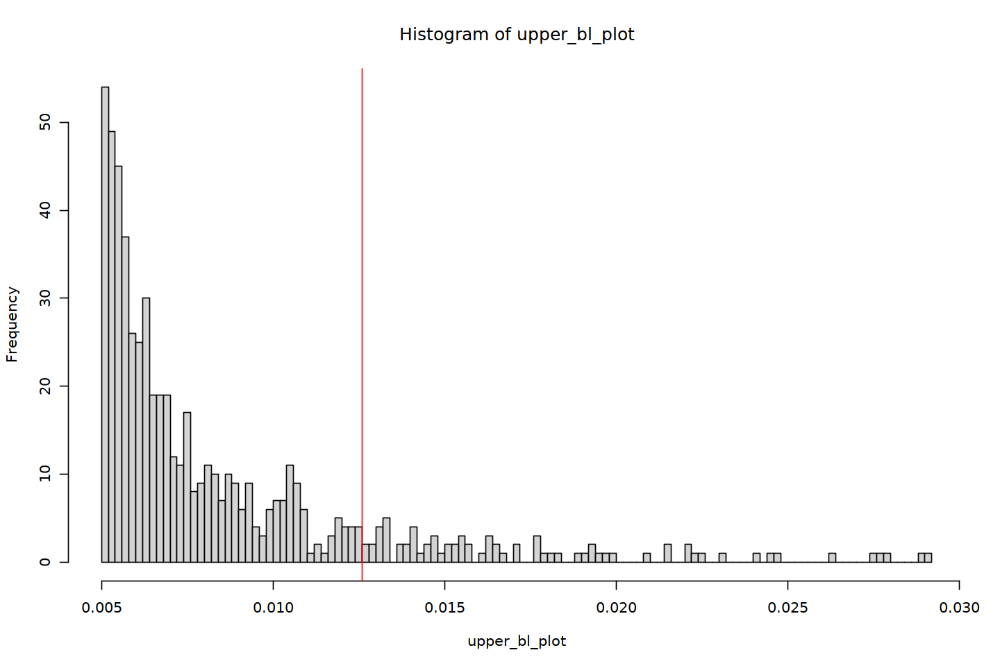

In [47]:
print(paste('Removes', as.character(sum(atac$blacklist_fraction > upper_bl_thresh)),'cells'))

options(repr.plot.width=12, repr.plot.height=8) # figure size

hist(upper_bl_plot, breaks = 100)
abline(v=upper_bl_thresh, col = 'red')


#### Nucleosome signal

Only remove upper tail

In [9]:
upper_ns_thresh = 2

In [49]:
upper_ns_plot <- atac$nucleosome_signal[atac$nucleosome_signal > 0.9]

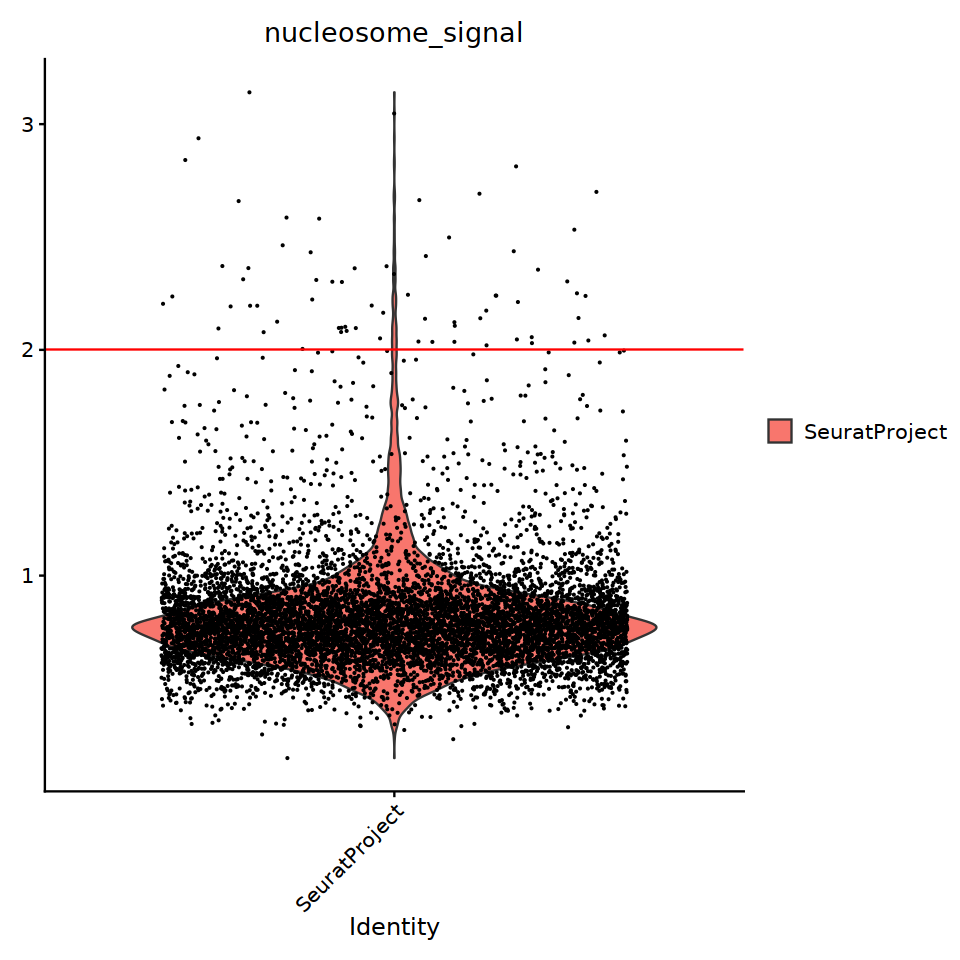

In [50]:
options(repr.plot.width=8, repr.plot.height=8) # figure size

v_plot <- VlnPlot(
    object = atac,
    features = c('nucleosome_signal'),
    pt.size = 0.1,
    ncol = 1
)

v_plot + 
geom_hline(yintercept=upper_ns_thresh, color='red') 

[1] "Removes 69 cells"


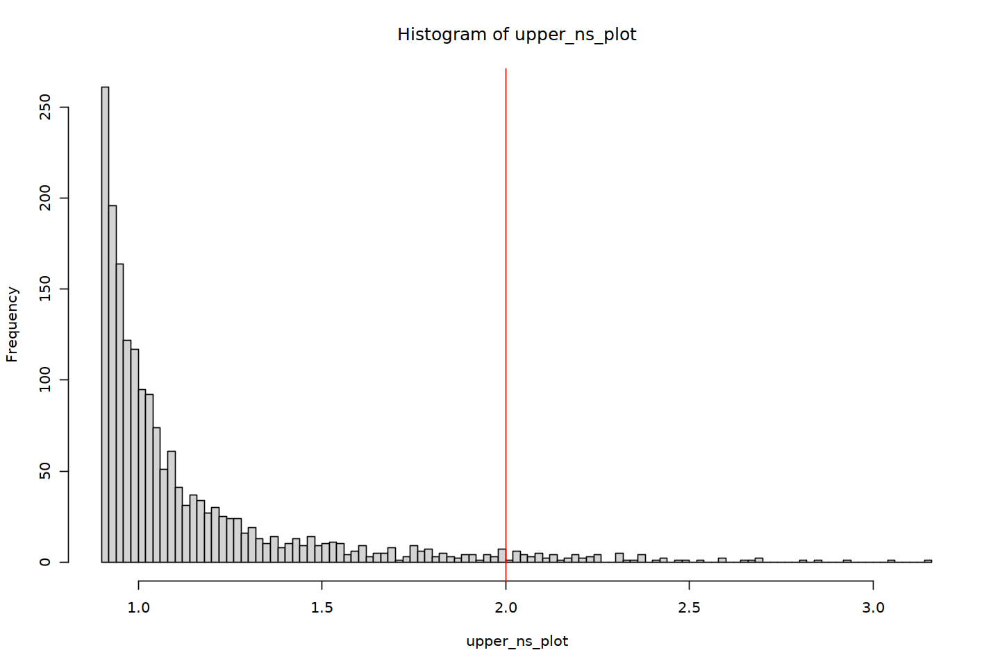

In [51]:
print(paste('Removes', as.character(sum(atac$nucleosome_signal > upper_ns_thresh)),'cells'))

options(repr.plot.width=12, repr.plot.height=8) # figure size

hist(upper_ns_plot, breaks = 100)
abline(v=upper_ns_thresh, col = 'red')


## Filter cells

To see how many cells are filtered after each step, the filters are applied sequentially.

In [81]:
# First filter atac object

n_before <- ncol(atac)
print(paste('Number of cells before filter step:', n_before))

atac_filtered <- subset(
    x = atac,
    subset = peak_region_fragments > lower_totfraq_thresh
)

n_after <- ncol(atac_filtered)
print(paste('Number of cells after filter step:', n_after))
print(paste('Percent removed', round((1 - n_after / n_before) * 100, 2),
            '% (', n_before - n_after, ')'))

[1] "Number of cells before filter step: 29329"
[1] "Number of cells after filter step: 29287"
[1] "Percent removed 0.14 % ( 42 )"


In [82]:
# Then use filtered object for subsequent filtering

n_before <- ncol(atac_filtered)
print(paste('Number of cells before filter step:', n_before))

atac_filtered <- subset(
    x = atac_filtered,
    subset = peak_region_fragments < upper_totfraq_thresh
)

n_after <- ncol(atac_filtered)
print(paste('Number of cells after filter step:', n_after))
print(paste('Percent removed', round((1 - n_after / n_before) * 100, 2),
            '% (', n_before - n_after, ')'))

[1] "Number of cells before filter step: 29287"
[1] "Number of cells after filter step: 29247"
[1] "Percent removed 0.14 % ( 40 )"


In [83]:
# TSS.enrichment

n_before <- ncol(atac_filtered)
print(paste('Number of cells before filter step:', n_before))

atac_filtered <- subset(
    x = atac_filtered,
    subset = TSS.enrichment > lower_tss_thresh &
        TSS.enrichment < upper_tss_thresh
)

n_after <- ncol(atac_filtered)
print(paste('Number of cells after filter step:', n_after))
print(paste('Percent removed', round((1 - n_after / n_before) * 100, 2),
            '% (', n_before - n_after, ')'))

[1] "Number of cells before filter step: 29247"
[1] "Number of cells after filter step: 29172"
[1] "Percent removed 0.26 % ( 75 )"


In [84]:
print(paste('Percent cells removed (total):', round((1-ncol(atac_filtered) / ncol(atac)) * 100, 2), '%'))

[1] "Percent cells removed (total): 0.54 %"


## Dimensionality reduction via LSI

Perfom latent sematic indexing (LSI) by generating term frequencies and SVD on these. LSI is adapted from NLP to identify similar documents. See some further details here: https://en.wikipedia.org/wiki/Latent_semantic_analysis#Latent_semantic_indexing


In [86]:
atac_filtered <- RunTFIDF(atac_filtered)

Performing TF-IDF normalization



In [87]:
atac_filtered <- FindTopFeatures(atac_filtered, min.cutoff = 'q0')

In [88]:
atac_filtered <- RunSVD(atac_filtered)

Running SVD

Scaling cell embeddings



In [89]:
options(repr.plot.width=16, repr.plot.height=9)

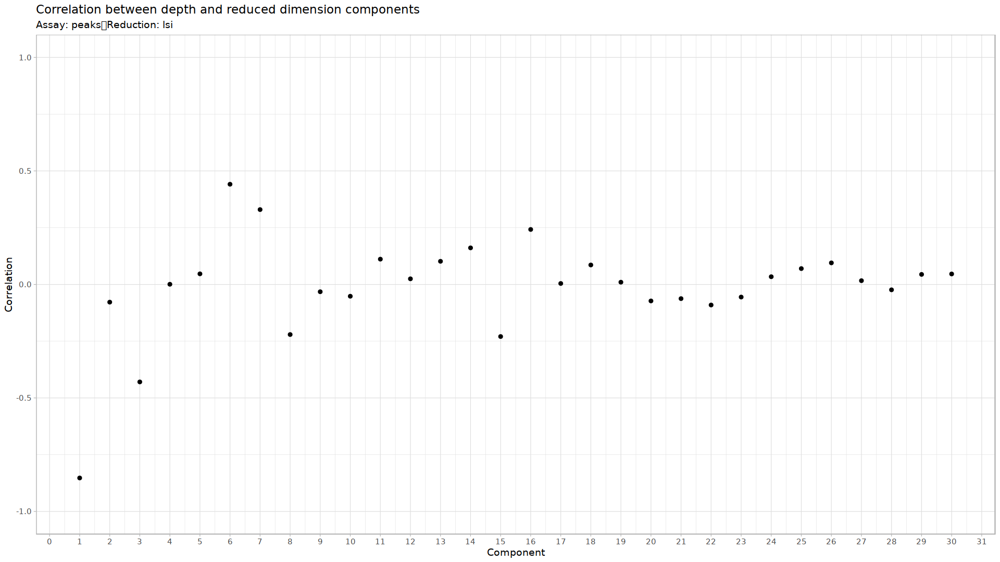

In [90]:
DepthCor(atac_filtered, n=30) 

**^^Plot above:** The first and sometimes few more LSI components are highly correlated to the total fragment count per cell (here, also refered to as sequencing depth). For downstream processing we would like to remove these components and work with the variance captured by the remaining components. In the plot below, the first component is nearly perfectly correlated with the sequencing depth per cell. Also the 4th component might be good to be removed.

## Save intermediate output

In [85]:
saveRDS(atac_filtered, file ='/lustre/groups/ml01/workspace/laura.martens/moretti_colab/signac/atac_fltr.rds')
#atac_filtered <- loadRDS(file ='data/multiome/proc_data/s1d1/atac_fltr.rds')

## Remove LSI components

To test the effect on the downstream processing, we create a neighborhood graph based on the components not correlated with the sequencing depth, cluster the cells and visualize our qc metrics on the data.

The goal is to remove LSI components that are highly correlated with the total number of fragments while keeping as much structure as possible.

For illustration purpose, we also perform clustering using all components. One can nicely see how this is driven by the number of atac_fragments (especially low counts).

Further points to consider when choosing components to remove:
- Often removing 1 or 2 components is enough
- A high count cluster might correlate with doublets, so removing all total count-driven variation can make separation of doublets/low quality cells more difficult (See plot with 1st, 2nd and 4th component removed)
- 50 LSI components were generated, 30 - 45 should be sufficient to include in total
- Despite removing total count-related LSI components, it is expected to see a high and/or low count cluster that might be sprinkeld across the UMAP. This we need to take care of during annotation (ATAC notebook part 2).


### With all components

In [91]:
# Defining, which components to keep:
dims_to_use <- c(1:40)

In [92]:
atac_fltr_all <- suppressMessages(RunUMAP(object = atac_filtered, reduction = 'lsi', dims = dims_to_use))

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"


In [93]:
atac_fltr_all <- FindNeighbors(object = atac_fltr_all, reduction = 'lsi', dims = dims_to_use)

Computing nearest neighbor graph

Computing SNN



In [94]:
atac_fltr_all <- FindClusters(object = atac_fltr_all, verbose = FALSE, algorithm = 3)

In [95]:
options(repr.plot.width=24, repr.plot.height=12)

In [96]:
dimplot1 <- DimPlot(object = atac_fltr_all, label = TRUE) + NoLegend()

In [97]:
peak_frac_pl <- FeaturePlot(
  object = atac_fltr_all,
  features = 'peak_region_fragments',
  pt.size = 0.1
) + ggtitle("atac_fragments - high counts highlighted")

In [98]:
peak_frac_low_pl <- FeaturePlot(
  object = atac_fltr_all,
  features = 'peak_region_fragments',
  pt.size = 0.1,
  max.cutoff=3000,
  cols = c("darkred", "lightgrey")
) + ggtitle("atac_fragments - low counts highlighted")

In [99]:
tss_pl <- FeaturePlot(
  object = atac_fltr_all,
  features = 'TSS.enrichment',
  pt.size = 0.1,
  max.cutoff=6,
  cols = c("darkred", "lightgrey")
)

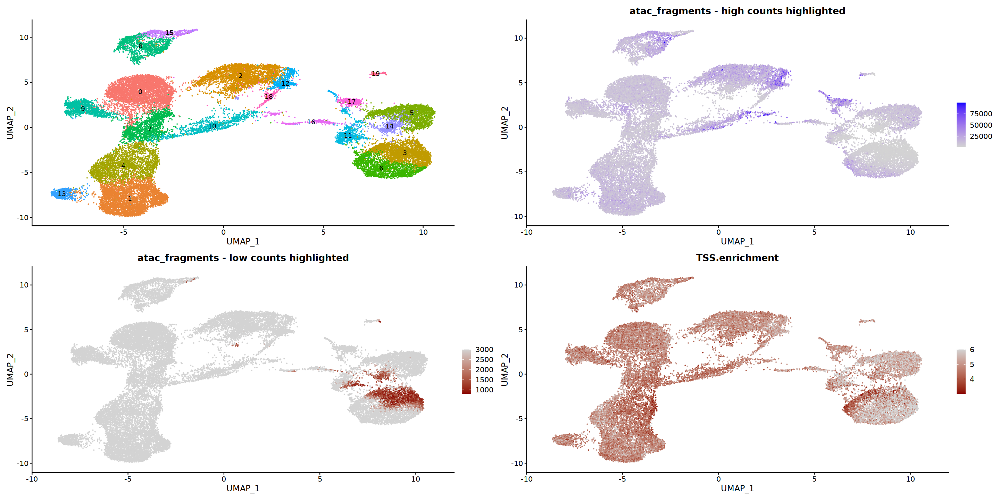

In [100]:
dimplot1 + peak_frac_pl + peak_frac_low_pl + tss_pl 

**^^Plot above:** Structure mainly driven by total counts (small number of counts)

### Removing only the first LSI component

In [101]:
# Defining, which components to keep:
dims_to_use <- c(2:40)

In [102]:
atac_fltr_1 <- suppressMessages(RunUMAP(object = atac_filtered, reduction = 'lsi', dims = dims_to_use))

In [103]:
atac_fltr_1 <- FindNeighbors(object = atac_fltr_1, reduction = 'lsi', dims = dims_to_use)

Computing nearest neighbor graph

Computing SNN



In [104]:
atac_fltr_1 <- FindClusters(object = atac_fltr_1, verbose = FALSE, algorithm = 3)

In [105]:
options(repr.plot.width=24, repr.plot.height=12)

In [106]:
dimplot1 <- DimPlot(object = atac_fltr_1, label = TRUE) + NoLegend()

In [107]:
peak_frac_pl <- FeaturePlot(
  object = atac_fltr_1,
  features = 'peak_region_fragments',
  pt.size = 0.1,
  max.cutoff=100000
)

In [108]:
peak_frac_low_pl <- FeaturePlot(
  object = atac_fltr_1,
  features = 'peak_region_fragments',
  pt.size = 0.1,
  max.cutoff=4000,
  cols = c("darkred", "lightgrey")
)

In [109]:
tss_pl <- FeaturePlot(
  object = atac_fltr_1,
  features = 'TSS.enrichment',
  pt.size = 0.1,
  max.cutoff=6,
  cols = c("darkred", "lightgrey")
)

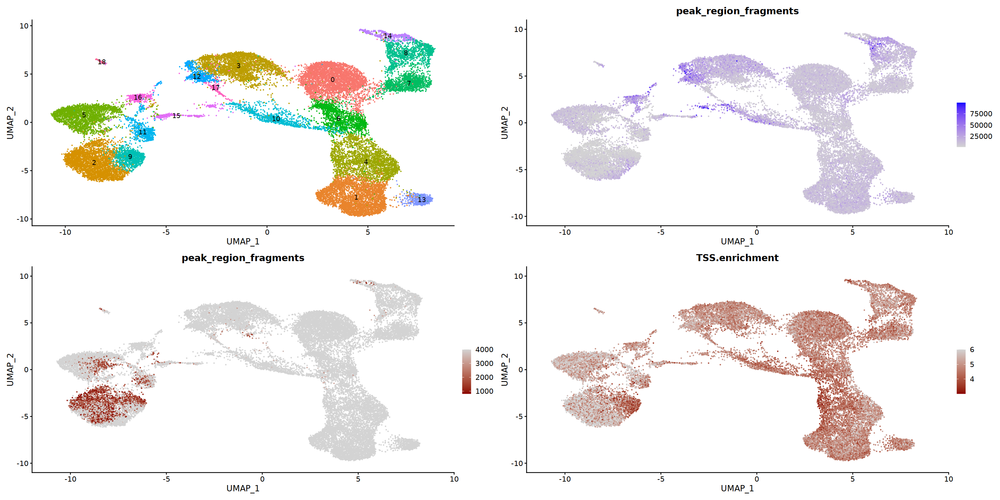

In [110]:
dimplot1 + peak_frac_pl + peak_frac_low_pl  + tss_pl 

**^^Plot above:** Clear structure; high count cluster present (3) that has some cells sprinkeld across the UMAP. 

### Removing 1st and 4th component

In [111]:
# Defining, which components to keep:
dims_to_use <- c(2,4,5:40)

In [112]:
atac_fltr_1a4 <- suppressMessages(RunUMAP(object = atac_filtered, reduction = 'lsi', dims = dims_to_use))

In [113]:
atac_fltr_1a4 <- FindNeighbors(object = atac_fltr_1a4, reduction = 'lsi', dims = dims_to_use)

Computing nearest neighbor graph

Computing SNN



In [114]:
atac_fltr_1a4 <- FindClusters(object = atac_fltr_1a4, verbose = FALSE, algorithm = 3)

In [115]:
options(repr.plot.width=24, repr.plot.height=12)

In [116]:
dimplot1 <- DimPlot(object = atac_fltr_1a4, label = TRUE) + NoLegend()

In [117]:
peak_frac_pl <- FeaturePlot(
  object = atac_fltr_1a4,
  features = 'peak_region_fragments',
  pt.size = 0.1,
  max.cutoff=100000
)

In [118]:
peak_frac_low_pl <- FeaturePlot(
  object = atac_fltr_1a4,
  features = 'peak_region_fragments',
  pt.size = 0.1,
  max.cutoff=3000,
  cols = c("darkred", "lightgrey")
)

In [119]:
tss_pl <- FeaturePlot(
  object = atac_fltr_1a4,
  features = 'TSS.enrichment',
  pt.size = 0.1,
  max.cutoff=6,
  cols = c("darkred", "lightgrey")
)

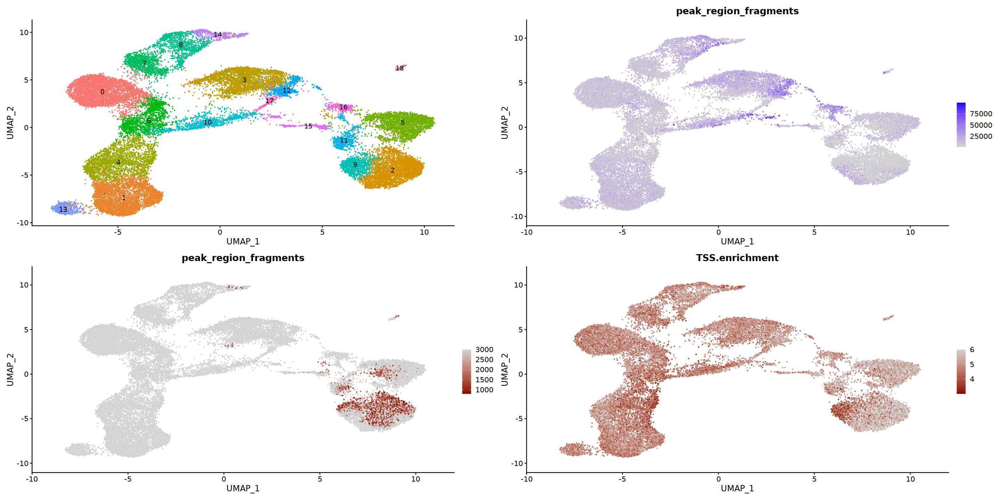

In [120]:
dimplot1 + peak_frac_pl + peak_frac_low_pl  + tss_pl 

**^^Plot above:**  Clear structure; high count cluster present (3) that has some cells sprinkeld across the UMAP.
This representation is used for downstrem processing, since it seems like single high count cells that might be doublets are rather assigned to cluster 3 and not merged with other clusters. 

**YJK to ML (or CL)**: I used the 0.5 as an arbitrary threshold for correlation coefficient of LSI components to cut off. Thus, I chose the LSI components 1 and 4 to be filtered out.

### Removing 1st, 2nd and 4th component

In [101]:
# Defining, which components to keep:
dims_to_use <- c(3,5:40)

In [102]:
atac_fltr_1a2a4 <- suppressMessages(RunUMAP(object = atac_filtered, reduction = 'lsi', dims = dims_to_use))

In [103]:
atac_fltr_1a2a4 <- FindNeighbors(object = atac_fltr_1a2a4, reduction = 'lsi', dims = dims_to_use)

Computing nearest neighbor graph

Computing SNN



In [104]:
atac_fltr_1a2a4 <- FindClusters(object = atac_fltr_1a2a4, verbose = FALSE, algorithm = 3)

In [105]:
options(repr.plot.width=24, repr.plot.height=12)

In [106]:
dimplot1 <- DimPlot(object = atac_fltr_1a2a4, label = TRUE) + NoLegend()

In [107]:
peak_frac_pl <- FeaturePlot(
  object = atac_fltr_1a2a4,
  features = 'atac_fragments',
  pt.size = 0.1,
  max.cutoff=100000
)

In [108]:
peak_frac_low_pl <- FeaturePlot(
  object = atac_fltr_1a2a4,
  features = 'atac_fragments',
  pt.size = 0.1,
  max.cutoff=3000,
  cols = c("darkred", "lightgrey")
)

In [109]:
tss_pl <- FeaturePlot(
  object = atac_fltr_1a2a4,
  features = 'TSS.enrichment',
  pt.size = 0.1,
  max.cutoff=6,
  cols = c("darkred", "lightgrey")
)

In [110]:
per_in_peak_pl <- FeaturePlot(
  object = atac_fltr_1a2a4,
  features = 'reads_in_peaks_frac',
  pt.size = 0.1,
  max.cutoff=0.6,
  cols = c("darkred", "lightgrey")
)

In [111]:
bl_pl <- FeaturePlot(
  object = atac_fltr_1a2a4,
  features = 'blacklist_fraction',
  pt.size = 0.1,
  max.cutoff=0.01
)

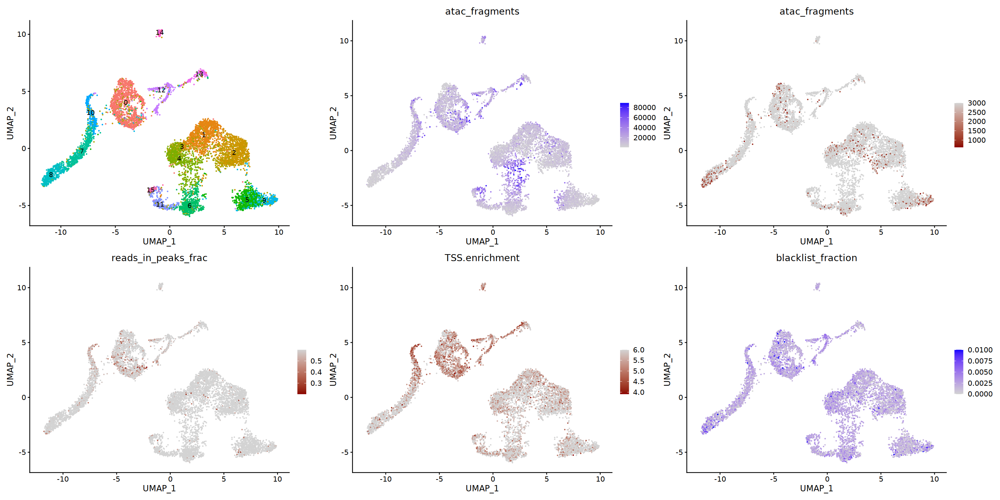

In [112]:
dimplot1 + peak_frac_pl + peak_frac_low_pl + per_in_peak_pl + tss_pl + bl_pl

**^^Plot above:**  Still a good representation, but some substructure of the small clusters seems to get 

## Get gene activities

Now that we have filtered the cells and decided on a dimensionality reduced embedding, we add interpretability to our data by generating a gene activity matrix based on the peak matrix. (takes several monutes)

In [121]:
# select object to add gene activity
atac_selected <- atac_fltr_1

# Define lsi components that should be used for downstream processing
# Here, we will filter out the 1st and 4th LSI components whose absolute values of correlation coefficients were above 0.5
lsi_comps = c(2:40)

In [ ]:
gene.activities <- GeneActivity(atac_selected)

In [ ]:
# add the gene activity matrix to the Seurat object as an RNA assay and normalize it
atac_selected[['RNA']] <- CreateAssayObject(counts = gene.activities)

In [116]:
atac_selected <- NormalizeData(
  object = atac_selected,
  assay = 'RNA',
  normalization.method = 'LogNormalize',
  scale.factor = median(atac_selected$nCount_RNA)
)

### Save as R object

In [117]:
saveRDS(atac_selected, file = "project/proc_data/s1d1/atac_fltr_geneAct.rds")

In [118]:
# Loading
#atac_selected <- readRDS(file = "data/multiome/proc_data/s1d1/atac_fltr_geneAct.rds")

### Save as anndata

In [119]:
meta_keep <- c('nCount_peaks', 'atac_fragments', 'TSS.enrichment',
               'reads_in_peaks_frac', 'blacklist_fraction',
               'nucleosome_signal')

In [120]:
# Create adata - Gene activity in adata.X and peaks in adata.obsm
adata <- anndata::AnnData(X = t(atac_selected[['RNA']]@data))

In [121]:
# Add meta data
adata$obs = atac_selected@meta.data[,meta_keep]

# Save binarized counts
adata$obsm[['peaks']] <- t(atac_selected[['peaks']]@counts)

# Save LSI and UMAP embeddings
adata$obsm[['lsi_full']] <- Embeddings(atac_selected, reduction = "lsi")
adata$obsm[['lsi_red']] <- Embeddings(atac_selected, reduction = "lsi")[,lsi_comps]

adata$obsm[['umap']] <- Embeddings(atac_selected, reduction = "umap")


In [122]:
# Save peak names
adata$uns[['peak_names']] <- rownames(atac_selected[['peaks']]@counts)


In [123]:
# Save to disk 
adata$write_h5ad("project/proc_data/s1d1/adata_geneAct.h5ad",
                compression = "gzip")

None

In [34]:
atac <- subset(
  x = atac,
  subset = peak_region_fragments > 1000 &
    peak_region_fragments < 50000 &
    pct_reads_in_peaks > 30 &
    blacklist_ratio < 0.02 &
    nucleosome_signal < 4 &
    TSS.enrichment > 2
)
atac

An object of class Seurat 
162003 features across 28361 samples within 1 assay 
Active assay: peaks (162003 features, 162003 variable features)
 2 dimensional reductions calculated: lsi, umap

In [27]:
atac

An object of class Seurat 
162003 features across 29329 samples within 1 assay 
Active assay: peaks (162003 features, 0 variable features)

# Normalization and linear dimensional reduction

In [35]:
atac <- RunTFIDF(atac)
atac <- FindTopFeatures(atac, min.cutoff = 'q0')
atac <- RunSVD(atac)

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings



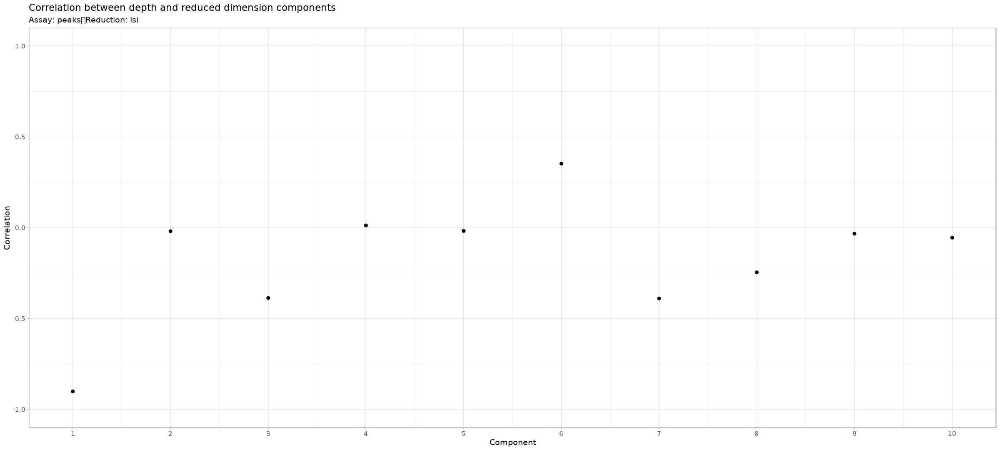

In [36]:
DepthCor(atac)

# Non-linear dimensionality reduction

18:09:30 UMAP embedding parameters a = 0.9922 b = 1.112

18:09:30 Read 28361 rows and found 29 numeric columns

18:09:30 Using Annoy for neighbor search, n_neighbors = 30

18:09:30 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

18:09:33 Writing NN index file to temp file /tmp/RtmpauNn2Y/file2df1636eb5175

18:09:33 Searching Annoy index using 1 thread, search_k = 3000

18:09:42 Annoy recall = 100%

18:09:45 Commencing smooth kNN distance calibration using 1 thread

18:09:50 Initializing from normalized Laplacian + noise

18:09:50 Commencing optimization for 200 epochs, with 1152058 positive edges

18:10:24 Optimization finished

Computing nearest neighbor graph

Computing SNN



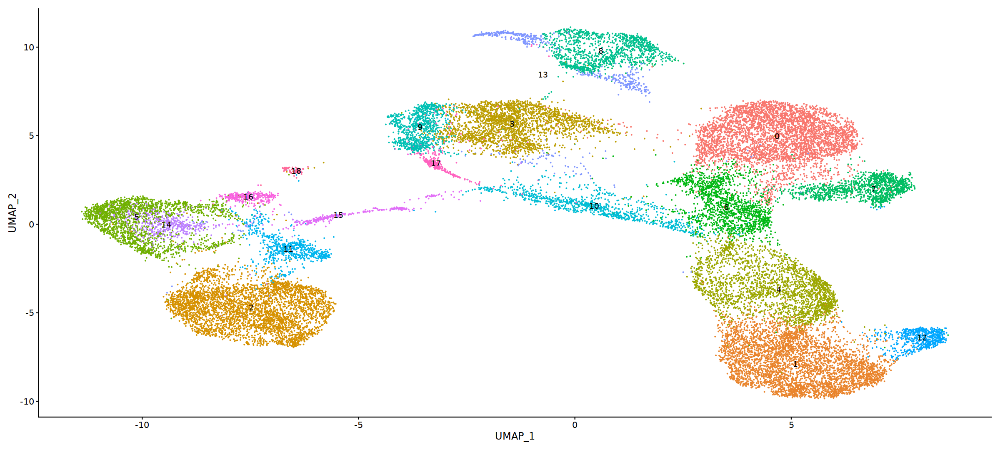

In [37]:
atac <- RunUMAP(object = atac, reduction = 'lsi', dims = 2:30)
atac <- FindNeighbors(object = atac, reduction = 'lsi', dims = 2:30)
atac <- FindClusters(object = atac, verbose = FALSE, algorithm = 3)
DimPlot(object = atac, label = TRUE) + NoLegend()

In [40]:
library(stringr)
days <- str_split(Cells(atac), '-', simplify=TRUE)[,2]

In [41]:
atac$day <- days

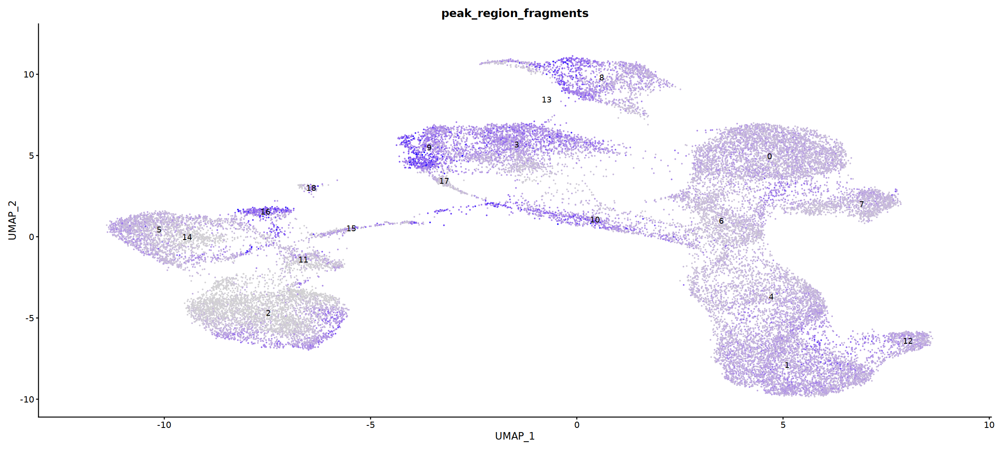

In [47]:
FeaturePlot(object = atac, label = TRUE, feature='peak_region_fragments') + NoLegend()

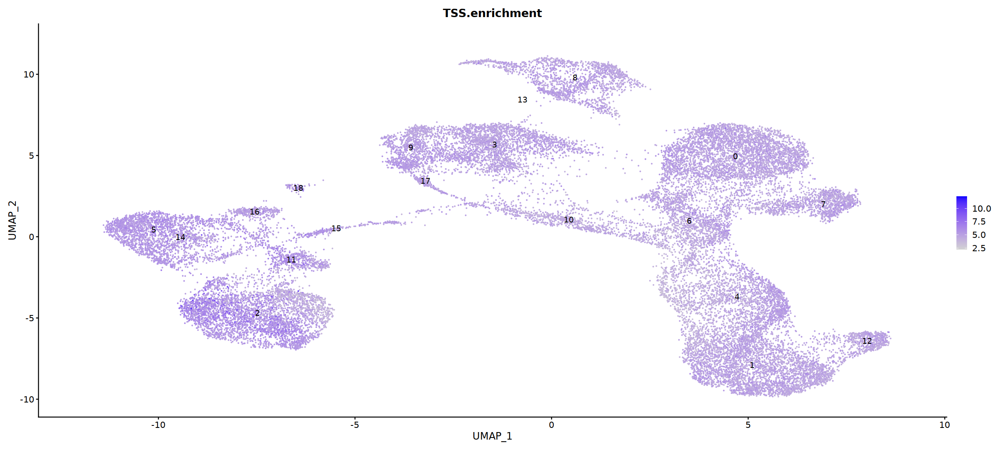

In [49]:
FeaturePlot(object = atac, label = TRUE, feature='TSS.enrichment') 


In [50]:
library(Seurat)
library(SeuratDisk)
library(SeuratData)

ERROR: Error in library(SeuratDisk): there is no package called 'SeuratDisk'


# Get gene activites matrix using signac

In [40]:
create_obj <- function(signac,sample, frag_file) {
    cells <- Cells(signac)
    sample_data <- signac[, str_subset(cells, sample)]
    counts <- GetAssayData(sample_data[['peaks']])

    colnames(counts) <- str_split(Cells(counts), "#", simplify=TRUE)[,2]
    fragments <- CreateFragmentObject(frag_file, validate.fragments = TRUE, cells=colnames(counts))

    chrom_assay <- CreateChromatinAssay(counts, fragments = fragments)
    obj <- CreateSeuratObject(chrom_assay, assay = "ATAC")
  return(obj)
}

In [11]:
gene.activities <- GeneActivity(signac)

Extracting gene coordinates



ERROR: Error in GeneActivity(signac): No fragment information found for requested assay


In [41]:
sampleFile = fread('/storage/groups/ml01/workspace/laura.martens/moretti_colab/signac/sample_file.csv')
objs <- list()
for(row in 1:nrow(sampleFile)){
    input <- sampleFile[row]
    frag_file <- input$fragments
    sample <- input$library_id
    print(sample)
    objs[sample] <- create_obj(signac, sample, frag_file)
}

[1] "MUC26649_1234"


Computing hash

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from atac to atac_"
Warning message in `[<-`(`*tmp*`, sample, value = create_obj(signac, sample, frag_file)):
"implicit list embedding of S4 objects is deprecated"


[1] "MUC26650_1234"


Computing hash

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from atac to atac_"
Warning message in `[<-`(`*tmp*`, sample, value = create_obj(signac, sample, frag_file)):
"implicit list embedding of S4 objects is deprecated"


[1] "MUC26651_1234"


Computing hash

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from atac to atac_"
Warning message in `[<-`(`*tmp*`, sample, value = create_obj(signac, sample, frag_file)):
"implicit list embedding of S4 objects is deprecated"


[1] "MUC26652_1234"


Computing hash

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from atac to atac_"
Warning message in `[<-`(`*tmp*`, sample, value = create_obj(signac, sample, frag_file)):
"implicit list embedding of S4 objects is deprecated"


[1] "MUC26653_1234"


Computing hash

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from atac to atac_"
Warning message in `[<-`(`*tmp*`, sample, value = create_obj(signac, sample, frag_file)):
"implicit list embedding of S4 objects is deprecated"


[1] "MUC26654_1234"


Computing hash

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from atac to atac_"
Warning message in `[<-`(`*tmp*`, sample, value = create_obj(signac, sample, frag_file)):
"implicit list embedding of S4 objects is deprecated"


[1] "MUC26655_1234"


Computing hash

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from atac to atac_"
Warning message in `[<-`(`*tmp*`, sample, value = create_obj(signac, sample, frag_file)):
"implicit list embedding of S4 objects is deprecated"


In [ ]:
# merge all datasets, adding a cell ID to make sure cell names are unique
combined <- merge(
  x = objs[1],
  y = objs[2:length(objs)],
  add.cell.ids = sampleFile$samples
)
combined[["ATAC"]]

In [ ]:
8

# Read RNA

In [8]:
data_path <- "/storage/groups/ml01/workspace/laura.martens/moretti_colab/transfer_data/"

In [9]:
counts <- fread(paste0(data_path, "counts.csv"))

Warning message in fread(paste0(data_path, "counts.csv")):
"Detected 24354 column names but the data has 24355 columns (i.e. invalid file). Added 1 extra default column name for the first column which is guessed to be row names or an index. Use setnames() afterwards if this guess is not correct, or fix the file write command that created the file to create a valid file."


In [10]:
mat <- as.matrix(counts[,3:ncol(counts)])

In [11]:
rownames(mat) <- counts$V1

In [12]:
mat <- t(mat)

In [13]:
coldata <- data.frame(clusters=as.factor(counts$clusters), row.names=colnames(mat))

In [16]:
rna <- CreateSeuratObject(mat, meta.data = coldata)

In [ ]:
rna <- NormalizeData(rna)
rna <- FindVariableFeatures(rna, nfeatures = 3000)
rna <- ScaleData(rna)
rna <- RunPCA(rna, npcs = 100)
rna <- RunTSNE(rna, dims = 1:30)
rna <- FindNeighbors(rna, dims = 1:30)
rna <- FindClusters(rna, resolution = 0.4, algorithm = 3)
rna <- RunUMAP(rna, graph = 'RNA_nn', metric = 'euclidean')

Centering and scaling data matrix

PC_ 1 
Positive:  TNNT2, TTN, ACTC1, MYL4, MYL7, TNNI1, TPM1, CTD-2545M3.8, MYH6, TNNC1 
	   FILIP1, NEBL, ACTA2, SORBS2, HSPB7, SLC8A1, MYBPC3, ACTN2, SLC25A4, NEXN 
	   SMPX, ENO3, TECRL, LDB3, PDLIM5, RYR2, MYL3, HSPB1, CSRP3, NKX2-5 
Negative:  HMGB1, RPS6, RPS3, HMGA1, RPSA, TUBB, CYP26A1, L1TD1, RANBP1, PTMA 
	   TUBA1C, SNRPB, TKT, RAN, TMSB4X, POU5F1, H2AFZ, ACTG1, CKS1B, HMGN2 
	   GJA1, RPL12, HMGB3, NPM1, GSTP1, TUBB2B, NASP, MGST1, CRABP1, S100A11 
PC_ 2 
Positive:  MIXL1, POU5F1, TDGF1, EOMES, GAL, PPP1R14B, NODAL, SFRP2, IER3, MESP1 
	   SP5, FGF17, C1QBP, CER1, NTS, FAM159B, TUBB2A, LAPTM4B, YBX1, L1TD1 
	   PGP, CDA, T, CCND1, CD9, GLRX5, IGFBP2, RP4-792G4.2, LZTS1, CRABP1 
Negative:  KRT19, FN1, PTPN13, DHRS3, TMEM88, S100A10, PDGFRA, FLRT3, APOA1, APOA2 
	   TFPI, PTGIS, PRTG, HOTAIRM1, LINC00261, CTSV, KRT8, FAM213A, ISL1, IGF2 
	   S100A13, APOC1, RP11-834C11.4, FGB, MEIS2, TTR, HABP2, TMEM141, LAMA1, MTTP 
PC_ 3 
Positive:  VIM, T